In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile
from IPython.display import Audio
%matplotlib inline
import os

from sklearn.decomposition import FastICA

from mcc import mean_corr_coef as mcc

In [15]:
# Load mixed audios
f, x1 = scipy.io.wavfile.read('new_audios/simultaneous_mixed/mixed_1.wav')

f, x2 = scipy.io.wavfile.read('new_audios/simultaneous_mixed/mixed_2.wav')

f, x3 = scipy.io.wavfile.read('new_audios/simultaneous_mixed/mixed_3.wav')

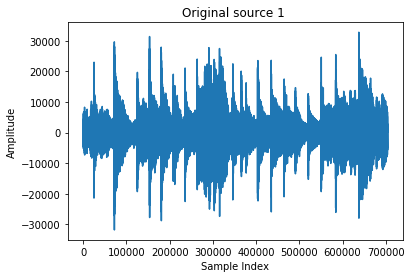

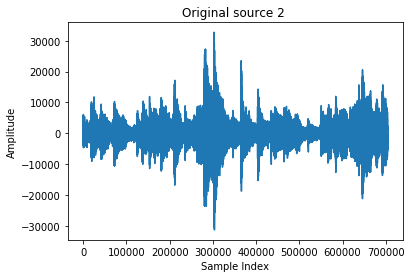

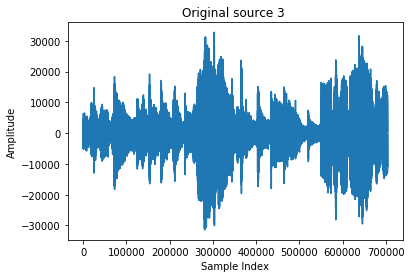

In [16]:
mixed = [x1, x2, x3]

# Visualize and play mixed sources
for i in range(len(mixed)):

    s = mixed[i]

    # plot waveform
    plt.figure()
    plt.plot(s)
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
    plt.title('Original source %d ' % (i+1))
    plt.show()

    # Play audio
    aud = Audio(s, rate=f)
    display(aud)

In [17]:
# Get estimated sources using ICA
X = np.array([x1, x2, x3])

In [18]:
X = X.T

In [19]:
X.shape

(704146, 3)

In [20]:
transformer = FastICA(n_components=3, random_state=0, whiten=True)

In [21]:
S_est = transformer.fit_transform(X)

In [22]:
S_est.shape

(704146, 3)

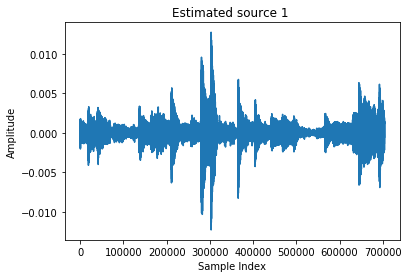

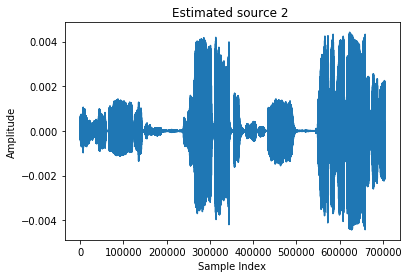

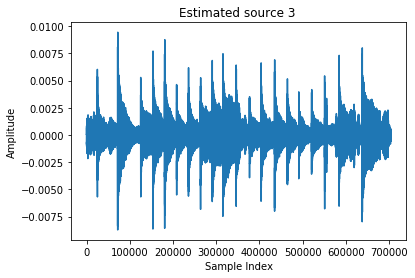

In [23]:
# Visualize and play estimated sources
for i in range(S_est.shape[1]):

    s = S_est[:,i]

    # plot waveform
    plt.figure()
    plt.plot(s)
    plt.xlabel('Sample Index')
    plt.ylabel('Amplitude')
    plt.title('Estimated source %d ' % (i+1))
    plt.show()

    # Play audio
    aud = Audio(s, rate=f)
    display(aud)

In [24]:
# Estimate ICA performance by calculating mean correlation coefficient

f, s1 = scipy.io.wavfile.read('new_audios/simultaneous/guitar.wav')

f, s2 = scipy.io.wavfile.read('new_audios/simultaneous/kalimba.wav')

f, s3 = scipy.io.wavfile.read('new_audios/simultaneous/whistle.wav')

In [25]:
S = np.array([s1, s2, s3])

S = S.T

In [26]:
mcc(S_est, S)

0.9995468365411705